<a href="https://colab.research.google.com/github/Polinia/projects_Portfolio/blob/main/Project%3A%20Forecasting%20Energy%20Demand/Forecasting_Energy_Demand.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project: Forecasting Energy Demand 

### Goal setting: 
* to get as mush information as possible from the available data 
* analysis of the influence of meteorological factors on electricity demand
* to develop an hourly electricity demand forecasting model

### Objectives:
* cleaning data
* exploring of data using visualization tools
* evaluating the influence of meteorological factors on electricity demand
* to build regression models using ML methods

## Import libraries and data

In [2]:
!pip install pandas-profiling -q
!pip install catboost -q

     |████████████████████████████████| 76.6 MB 1.3 MB/s 


In [3]:
#for data processing and manipulation:
import pandas as pd
from pandas import Series
import numpy as np
#for quick overview:
import pandas_profiling
from pandas_profiling import ProfileReport 
#for data visualization:
%matplotlib inline
from matplotlib.pyplot import * 
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# import itertools
from datetime import timedelta
#for loading machine learning models and metrics:
from sklearn import metrics   
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score, mean_squared_error
import catboost as cb
from catboost import CatBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor


import warnings 
warnings.simplefilter('ignore')

In [ ]:
!pip freeze > requirements.txt
# fixing RANDOM_SEED for same results
RANDOM_SEED = 42

In [4]:
#loading data
data1 = pd.read_csv('meter_data.csv')
data2 = pd.read_csv('weather_data.csv')

In [ ]:
data1.head(3)

,date_time,reading
0,2014/01/01 00,5408.26
1,2014/01/01 01,5225.29
2,2014/01/01 02,5063.83


In [ ]:
data1.isna().sum()

date_time    0
reading      0
dtype: int64

In [ ]:
data2.head(3)

,date_time,drybulb,dewpoint,windspeed,winddirection,illumination,cloudcover,humidex,windchill
0,2014/01/01 00,-9.9,-15.3,22,270.0,0,4,0,-18.0
1,2014/01/01 01,-10.1,-16.3,24,270.0,0,4,0,-19.0
2,2014/01/01 02,-10.6,-16.0,22,270.0,0,4,0,-19.0


In [ ]:
data2.isna().sum()

date_time            0
drybulb              0
dewpoint             0
windspeed            0
winddirection       36
illumination         0
cloudcover           0
humidex              0
windchill        17341
dtype: int64

we have 2 datasets with same id as date_time. Let's merge them, saving all data, before starting cleaning and exploring 

In [5]:
df = data2.merge(data1, on='date_time', how='outer')

I keep all given data and then will decide what to do with missing data

In [ ]:
df.head(5)

,date_time,drybulb,dewpoint,windspeed,winddirection,illumination,cloudcover,humidex,windchill,reading
0,2014/01/01 00,-9.9,-15.3,22,270.0,0,4,0,-18.0,5408.26
1,2014/01/01 01,-10.1,-16.3,24,270.0,0,4,0,-19.0,5225.29
2,2014/01/01 02,-10.6,-16.0,22,270.0,0,4,0,-19.0,5063.83
3,2014/01/01 03,-11.3,-15.9,17,240.0,0,4,0,-19.0,4944.23
4,2014/01/01 04,-11.3,-15.6,19,250.0,0,2,0,-19.0,4885.06


## Exploration and Cleaning

#### Description

*	date_time – The date and time measurement stamp
*	reading – The measurement of average hourly electricity demand taken in the weather 
*	drybulb – a measure of dry-bulb temperature in degrees Celsius 
*	dewpoint – a measure of dew point temperature in degrees Celsius 
*	windspeed – a measure of wind speed in km/h
*	winddirection – a measure in degrees ranging from 0 to 360
*	illumination – measured in klux
*	humidex - measures of apparent temperature in degrees Celsius
* windchill –  a term used to describe what the air temperature feels like to the human skin due to the combination of cold temperatures and winds blowing on exposed skin


In [ ]:
#let's first check duplicates
df['date_time'].duplicated().sum()

0

In [ ]:
# checking missing values
df.isnull().sum()

date_time            0
drybulb              0
dewpoint             0
windspeed            0
winddirection       36
illumination         0
cloudcover           0
humidex              0
windchill        17341
reading              5
dtype: int64

In [ ]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Brief summary:
- in total dataset consists 76680 observations and 10 variables. 
- 1 of them is a date that should be processed first. 
- 'windchill' has 17341 (22.6%) missing values. 
- there are 5 NaN in 'reading' that appeared artificially after merging
- correlation between 'dewpoint' and 'drybulb'

# EDA

## Date_time

In [ ]:
df.date_time

0        2014/01/01 00
1        2014/01/01 01
2        2014/01/01 02
3        2014/01/01 03
4        2014/01/01 04
             ...      
76675    2022/09/30 19
76676    2022/09/30 20
76677    2022/09/30 21
76678    2022/09/30 22
76679    2022/09/30 23
Name: date_time, Length: 76680, dtype: object

In [6]:
#Let's check date and change it to the format to work comfortable with
# converting strings into DateTimes
df.date_time = pd.to_datetime(df.date_time)
display(df.date_time.head(5))

0   2014-01-01 00:00:00
1   2014-01-01 01:00:00
2   2014-01-01 02:00:00
3   2014-01-01 03:00:00
4   2014-01-01 04:00:00
Name: date_time, dtype: datetime64[ns]

In [ ]:
print("The first date:", df.date_time.min(), "The last:", df.date_time.max())

The first date: 2014-01-01 00:00:00 The last: 2022-09-30 23:00:00


We can split up the date-timestamp column into its different components. This will allow us to find patterns for different groups.

In [7]:
# will create simple new features based on 'date'
df['day'] = df.date_time.dt.day
df['month'] = df.date_time.dt.month
df['year'] = df.date_time.dt.year
df['hour'] = df.date_time.dt.hour
df["weekday"] = df["date_time"].dt.weekday

In [ ]:
df.iloc[:,10:].head(5)

,day,month,year,hour,weekday
0,1,1,2014,0,2
1,1,1,2014,1,2
2,1,1,2014,2,2
3,1,1,2014,3,2
4,1,1,2014,4,2


In [8]:
#Plotting the energy consumption over time
fig = px.line(df,
              x='date_time',
              y='reading',
              title=f'Power Demand over time 2014-2022')
fig.update_traces(line=dict(width=0.5))
fig.update_layout( width=800, height=500, 
                  xaxis_title='Date & Time',
                  yaxis_title='Energy Demand')
fig.show()

The first interactive plot shows that there is some yearly seasonality in the data. highest energy demand peaks are in July - September (explained by higher demand in cooling systems)
The second peak happens in colder months with increase in November and increase in March (explained by the need in heating).

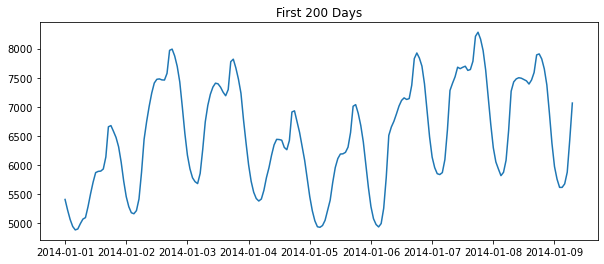

In [ ]:
plt.figure(figsize=(10, 4))
plt.title("First 200 Days")
plt.plot(df['date_time'].dt.to_pydatetime()[:200], df['reading'][:200])
plt.show()

The second plot shows the first 200 days of data. We can see that energy demand is not consistent day to day. If there is any weekly seasonality in the data, it is difficult to identify from this plot.

Let's now compare winter and summer months of electr. demand

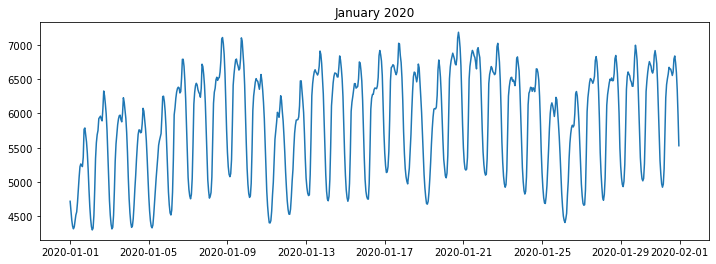

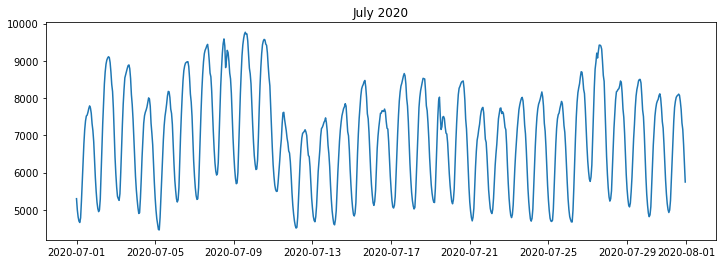

In [ ]:
plt.figure(figsize=(12, 4))
plt.title("January 2020")
plt.plot(df['date_time'].loc[(df['date_time']  >= '2020-01-01') &
               (df['date_time'] < '2020-02-01')], df['reading'].\
      loc[(df['date_time']  >= '2020-01-01') & (df['date_time'] < '2020-02-01')])


plt.figure(figsize=(12, 4))
plt.title("July 2020")
plt.plot(df['date_time'].loc[(df['date_time']  >= '2020-07-01') &
               (df['date_time'] < '2020-08-01')], df['reading'].\
        loc[(df['date_time']  >= '2020-07-01') & (df['date_time'] < '2020-08-01')])
plt.show()

In winter months we see that people tend to use less energy mid-day. Conversely, in summer months the daily load is more bell-shaped because of the using of AC during the day

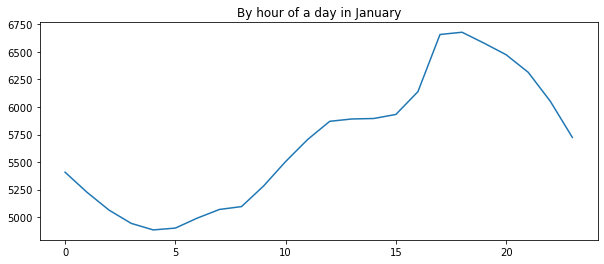

In [ ]:
plt.figure(figsize=(10, 4))
plt.title("By hour of a day in January")
plt.plot(df['hour'][:24].loc[df['month'] == 1], df['reading'][:24].loc[df['month'] == 1])
plt.show()

the hourly electrical load is highly dependent on the hour of a day and outdoor temperature. Explication of demand the increase is simple so as people come after their work and start doing house chores such as cooking, putting on washing and drying machines, turning on AC.

Distribution over weekdays:

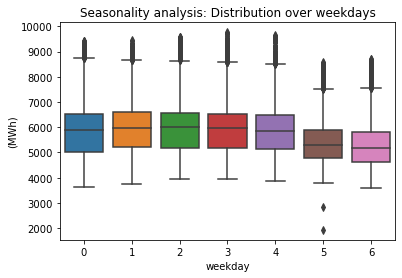

In [ ]:
sns.boxplot(data=df, x="weekday", y="reading")
plt.title("Seasonality analysis: Distribution over weekdays")
plt.ylabel("(MWh)")
plt.show()

array([[<AxesSubplot:title={'center':'drybulb'}>,
        <AxesSubplot:title={'center':'dewpoint'}>,
        <AxesSubplot:title={'center':'windspeed'}>],
       [<AxesSubplot:title={'center':'winddirection'}>,
        <AxesSubplot:title={'center':'illumination'}>,
        <AxesSubplot:title={'center':'cloudcover'}>],
       [<AxesSubplot:title={'center':'humidex'}>,
        <AxesSubplot:title={'center':'windchill'}>, <AxesSubplot:>]],
      dtype=object)

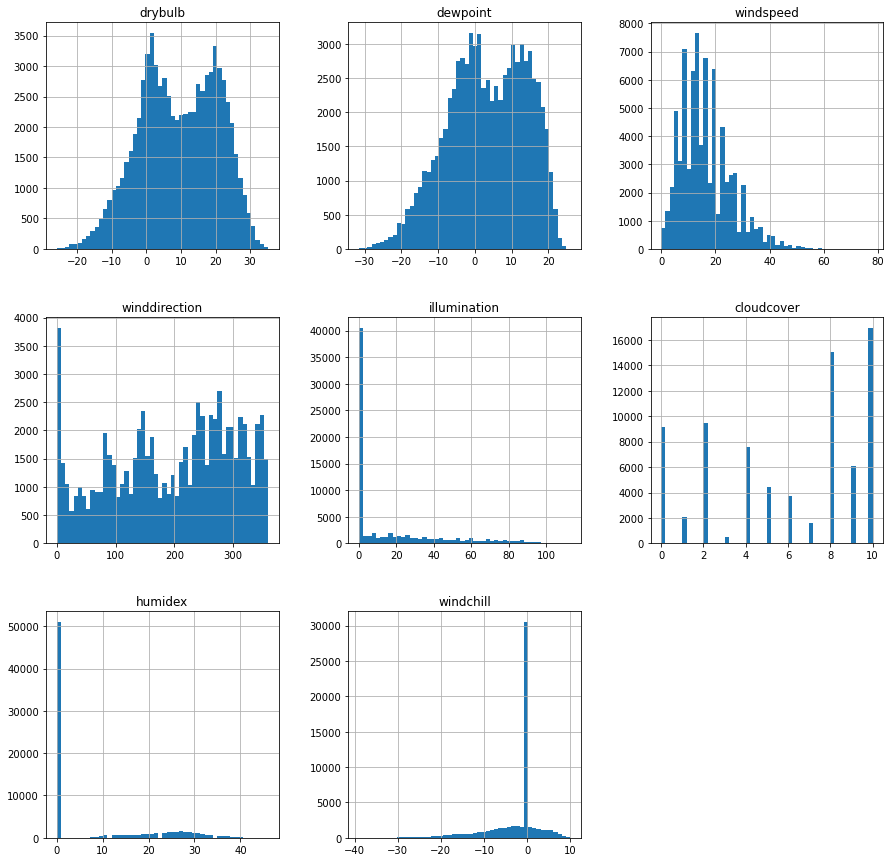

In [ ]:
# Let's look at the quick distribution analysis of variables using visualization
df.iloc[:,1:9].hist(
    figsize=(15, 15), bins=50)

Let's now look closer at meteorological factors 

## Drybulb (degree C)

In [ ]:
#quick overview
df.drybulb.describe()

count    76680.000000
mean         9.360917
std         11.255635
min        -26.000000
25%          0.800000
50%          9.400000
75%         19.000000
max         35.200000
Name: drybulb, dtype: float64

<AxesSubplot:title={'center':'Temperature distribution over months'}, xlabel='month'>

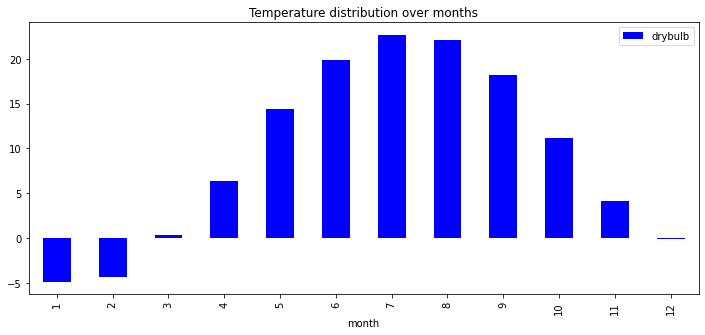

In [ ]:
# checking average temperature records for each month 
df.groupby(["month"])[['drybulb']].mean().plot.bar(color="blue", 
    legend='False', figsize=(12,5), title = 'Temperature distribution over months')

The plot shows the temperature distribution over months, we clearly see an increase of temperature degrees in summer periods, which justifies the high electricity demand by AC .
Although in winter you can see a decrease in temperature, however, this does not mean high electricity consumption due to the fact that in Ontario households use for their primary heating system:
- 31% used electricity  
- 67% used natural gas 
- 4% used oil.

In [9]:
# Electricity demand by months depending on temperature
# aggregated data:
grouped = df\
    .groupby(['month','drybulb'], as_index=False).agg({'reading':'mean'})

# plotting
fig = px.line(grouped,
              x='drybulb', 
              y='reading', 
              color='month',
              color_discrete_sequence = px.colors.sequential.Viridis,
              title='Electricity demand by months depending on temperature')
fig.update_layout(width=900, height=500, xaxis_title='degree temperature',
                  yaxis_title='Energy Demand')
fig.show()

The peak demand for electricity, as I mentioned earlier, are in June-September

## Illumination

In [ ]:
df.illumination.value_counts()

0      37836
1       1613
2       1102
3        752
4        714
       ...  
105       13
113        9
110        9
108        7
109        2
Name: illumination, Length: 114, dtype: int64

<AxesSubplot:title={'center':'illumination over months'}, xlabel='month'>

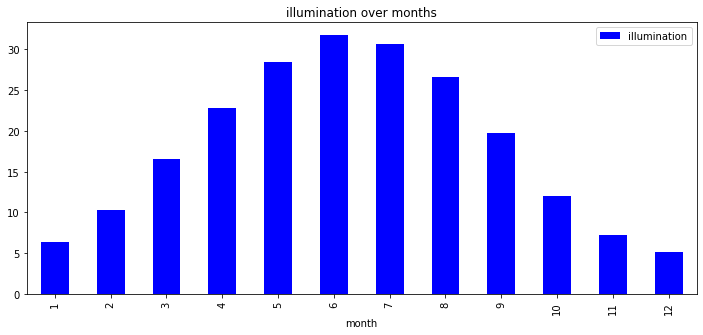

In [ ]:
df.groupby(["month"])[['illumination']].mean().plot.bar(color="blue", 
            legend='False', figsize=(12,5), title = 'illumination over months')

Here we see the average distribution of illumination by month. During sunny summer days, apartment temperature could increase up to 28-30C, which means the consumption of electricity will be higher due to increased need for cooling.

## Winddirection

In [ ]:
#There are some missing data
df.winddirection.isnull().sum()

36

In [ ]:
df.winddirection.describe()

count    76644.000000
mean       195.483834
std        105.260398
min          0.000000
25%        110.000000
50%        213.000000
75%        284.000000
max        359.000000
Name: winddirection, dtype: float64

I will fill Nans with mean values

In [ ]:
df.winddirection = df.winddirection.fillna('195').astype(int)
df.winddirection.isnull().sum() # checking missing data

0

## Cloudcover: (0-10)
0 - clear sky

10 - sky obscured, eg by fog

Text(0, 0.5, 'consumption')

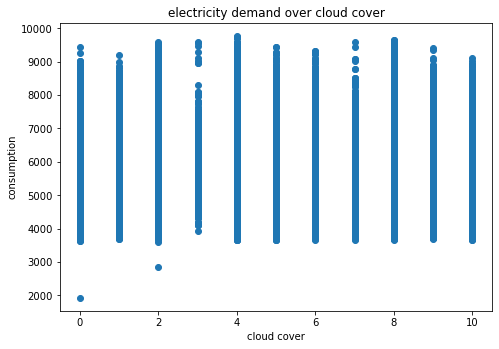

In [ ]:
fig = plt.figure()
axes = fig.add_axes([0, 0, 1, 1])
axes.scatter(x = df['cloudcover'], y = df['reading'])
axes.set_title('electricity demand over cloud cover')
axes.set_xlabel('cloud cover')
axes.set_ylabel('consumption')

we can observe that  the presence of clouds doesn't greatly affect electricity consumption. But I also wanted to look at the interactive plot by month if my guess is right

In [10]:
# aggregated data
grouped = df\
    .groupby(['month', 'cloudcover'], as_index=False).agg({'reading':'mean'})

# plotting
fig = px.line(grouped,
              x='month', 
              y='reading', 
              color='cloudcover', 
              title='Average monthly electricity demand per months')
fig.update_layout(width=900, height=500, xaxis_title='month',
                  yaxis_title='Energy Demand')
fig.show()

As I thought the month of the year is much more important than the cloud cover. In July with a clear sky consumption  could be less than in the same month with some clouds.

## Humidex (describe how hot the weather feels to the average person)

In [ ]:
df.humidex.value_counts()

0     50974
27     1504
26     1453
25     1414
28     1390
29     1308
24     1278
23     1241
30     1229
31     1153
22     1151
21      968
32      927
19      841
20      796
33      770
18      738
17      685
34      639
16      623
14      622
15      610
11      584
12      568
13      564
35      496
10      448
36      386
37      313
9       266
38      225
39      156
8       125
40       89
41       57
7        36
42       26
43       15
45        5
44        4
6         2
46        1
Name: humidex, dtype: int64

Text(0, 0.5, 'consumption')

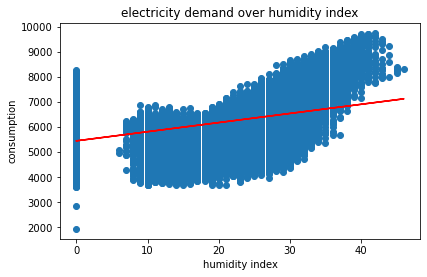

In [ ]:
# checking the electricity demand dependent on humidity index
x = df['humidex']
y = df['reading']
m, b = np. polyfit(x, y, 1)  
fig = plt.figure(figsize = (5,3))
axes = fig.add_axes([0, 0, 1, 1])
axes.scatter(x, y)
plt. plot(x, m*x + b,'r') #added line of best fit.
axes.set_title('electricity demand over humidity index')
axes.set_xlabel('humidity index')
axes.set_ylabel('consumption')

Electricity consumption can increase with specific humidity in warm seasons when cooling air conditioning is applied

<AxesSubplot:>

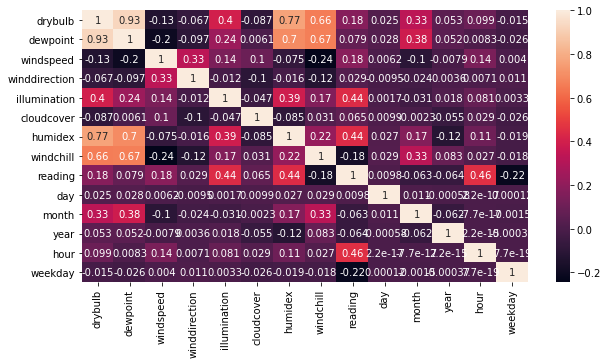

In [ ]:
# I will build a correlation matrix for numerical features to see if something needs to be dropped
plt.figure(figsize=(10,5))
sns.heatmap(df.corr(), annot=True)

I found a significant linear relationship between the temperature variable and dew point temperature. Based on this fact, it was decided to exclude the dew point temperature factor, since it is more difficult to obtain than the ambient temperature. By the way, the temperature has only  18% correlation with the target variable. Also, there is correlation between 'humidex' and 'windchill'. I would better exclude 'windchill' also because of the 23% missing values (~17341).

In [ ]:
df.drop(['dewpoint', 'windchill'], axis=1, inplace=True)

In [ ]:
df = df.set_index('date_time')

## Reading - target

<AxesSubplot:title={'center':'Distribution of electricity demand'}, ylabel='Frequency'>

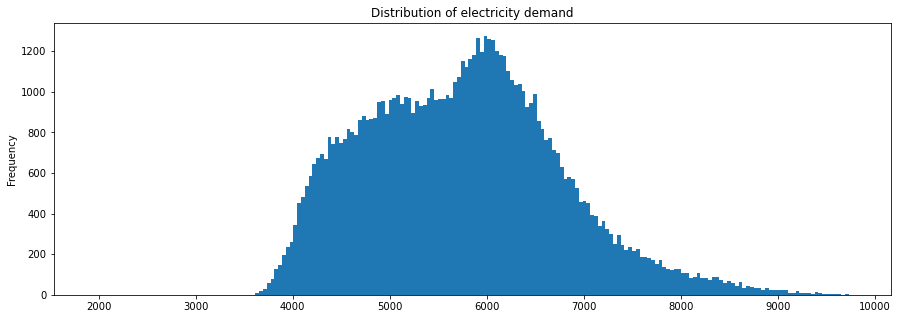

In [ ]:
#first let's look at the distribution of electricity demand
df['reading'].plot.hist(figsize=(15, 5), bins=200,
                    title='Distribution of electricity demand')

In [ ]:
df.reading.isnull().sum() #there are some missing data after merging

5

In [ ]:
df.reading.describe()

count    76675.000000
mean      5745.492059
std       1007.146277
min       1929.290000
25%       4967.645000
50%       5740.460000
75%       6389.450000
max       9769.400000
Name: reading, dtype: float64

In [ ]:
# filling missing data with the mean value
df.reading.fillna(5745.49,inplace=True)
df.reading.isnull().sum()

0

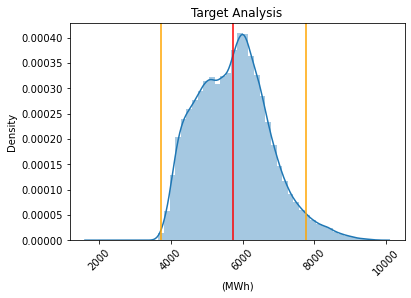

In [ ]:
# let's look at the standard deviation of the target variable
mean_cons = np.mean(df.reading.values)
std = np.std(df.reading.values)
sns.distplot(df.reading)
plt.title("Target Analysis")
plt.xticks(rotation=45)
plt.xlabel("(MWh)")
plt.axvline(x=mean_cons, color='r', linestyle='-', 
            label="\mu: {0:.2f}%".format(mean_cons))
plt.axvline(x=mean_cons+2*std, color='orange', linestyle='-')
plt.axvline(x=mean_cons-2*std, color='orange', linestyle='-')
plt.show()

We see that data doesn't look like a normal distribution, because it has a small right tail and the chance of observing extreme values is smaller, compared to normally distributed data

Let's look at the outliers distribution using boxplots

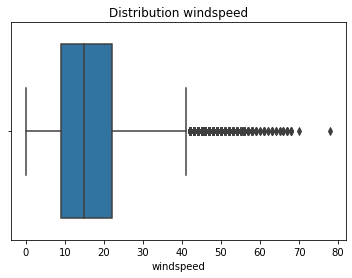

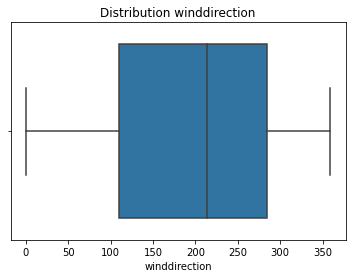

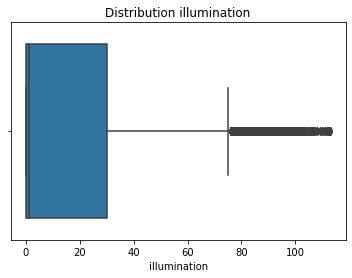

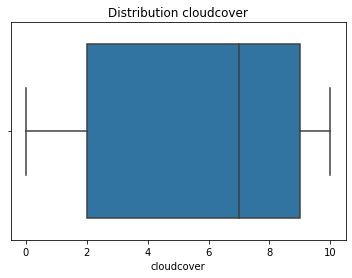

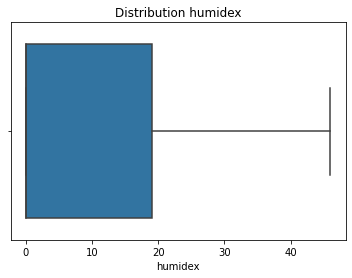

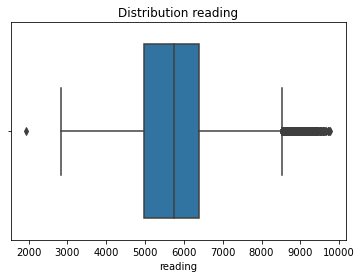

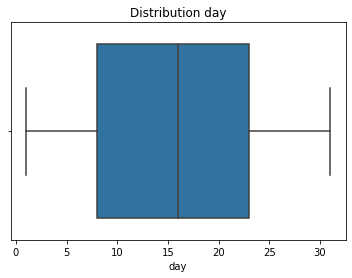

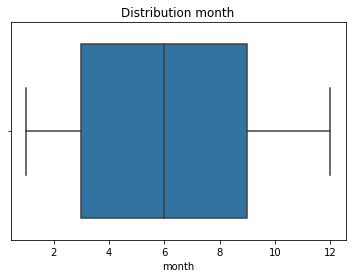

In [ ]:
for col in df.iloc[:,1:9]:
    plt.title(f"Distribution {col}")
    sns.boxplot(x = col,data=df)
    plt.show()

Some features definitely show outliers, but it's worth considering the different weather conditions.

## the feauture importance

<AxesSubplot:>

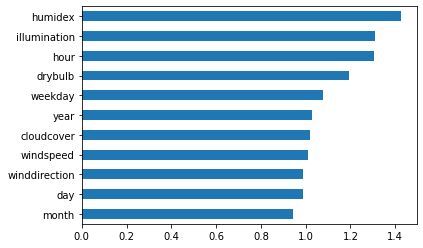

In [ ]:
num_cols = df.drop('reading',axis=1).columns
imp_num = Series(f_classif(df[num_cols], df['reading'])[0], index=num_cols)
imp_num.sort_values(inplace=True)
imp_num.plot(kind='barh')

Feature importance shows us how useful features are at predicting a target variable. Here we see that such factors as humidity index, illumination, hour of the day, and outdoor temp greatly affect the target. As I found out earlier during my analysis
Conclusion: all signs matter, I will not delete any of them.

# Building the model

In [ ]:
# The original datasets were split into training and test sets as 80 and 20%
train_df, test_df = np.split(df, [int(.8*len(df))])

In [ ]:
X = train_df.drop('reading',axis=1)
y = train_df['reading']
# Datasets labeled "train" will be used for training the model, "test" is for testing.
# For testing, we will use 25% of the original dataset.
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                      test_size=0.2, shuffle=True, random_state=RANDOM_SEED)

In [ ]:
# Creating a simple model
reg = LinearRegression()
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)
print(f"TEST mape: {(mean_absolute_percentage_error(y_test, y_pred))*100:0.2f}%")  
print(f"TEST r2: {(r2_score(y_test, y_pred))*100:0.2f}%")

TEST mape: 9.06%
TEST r2: 59.06%


In [ ]:
# Creating RandomForest model
rfr = RandomForestRegressor(random_state = RANDOM_SEED).fit(X_train, y_train)
rfr.fit(X_train, y_train)
y_pred = rfr.predict(X_test)
print(f"MAPE: {(mean_absolute_percentage_error(y_test, y_pred))*100:0.2f}%")
print(f"TEST r2: {(r2_score(y_test, y_pred))*100:0.2f}%")

MAPE: 2.07%
TEST r2: 96.98%


In [ ]:
train_dataset = cb.Pool(X_train, y_train) 
test_dataset = cb.Pool(X_test, y_test)
model = cb.CatBoostRegressor(eval_metric='MAPE',
                             iterations = 1000,
                          depth=6,
                          learning_rate = 0.5) #adding a few parameters
model.fit(X_train, y_train,
           eval_set=(X_test, y_test), verbose_eval=100, use_best_model=True)

test_predict_catboost = model.predict(X_test)

0:	learn: 0.0948924	test: 0.0940754	best: 0.0940754 (0)	total: 159ms	remaining: 2m 38s
100:	learn: 0.0202981	test: 0.0208920	best: 0.0208920 (100)	total: 667ms	remaining: 5.94s
200:	learn: 0.0172088	test: 0.0184411	best: 0.0184411 (200)	total: 1.48s	remaining: 5.89s
300:	learn: 0.0155586	test: 0.0174720	best: 0.0174720 (300)	total: 2.32s	remaining: 5.39s
400:	learn: 0.0143548	test: 0.0167053	best: 0.0167053 (400)	total: 3.08s	remaining: 4.61s
500:	learn: 0.0133086	test: 0.0160573	best: 0.0160563 (498)	total: 3.87s	remaining: 3.85s
600:	learn: 0.0124713	test: 0.0156183	best: 0.0156183 (600)	total: 4.59s	remaining: 3.05s
700:	learn: 0.0117946	test: 0.0152515	best: 0.0152515 (700)	total: 5.35s	remaining: 2.28s
800:	learn: 0.0112234	test: 0.0149467	best: 0.0149432 (797)	total: 6.2s	remaining: 1.54s
900:	learn: 0.0107110	test: 0.0147242	best: 0.0147230 (899)	total: 7.13s	remaining: 784ms
999:	learn: 0.0102386	test: 0.0145517	best: 0.0145517 (999)	total: 7.89s	remaining: 0us

bestTest = 0.01

In [ ]:
print(f"MAPE: {(mean_absolute_percentage_error(y_test, test_predict_catboost))*100:0.2f}%")
print(f"TEST r2: {(r2_score(y_test, test_predict_catboost))*100:0.2f}%")

MAPE: 1.46%
TEST r2: 98.68%


It is even too good result, let's see the prediction on test set(15%)


Doing prediction on test data:

In [ ]:
X_sub = test_df.drop('reading',axis=1)
y_sub = test_df['reading']

In [ ]:
predict_submission1 = model.predict(X_sub) #был X_test
print(f"MAPE: {(mean_absolute_percentage_error(y_sub, predict_submission1))*100:0.2f}%")
print(f"TEST r2: {(r2_score(y_sub, predict_submission1))*100:0.2f}%")

MAPE: 3.62%
TEST r2: 92.63%


The result is still good, let's look at the comparison and plot

In [ ]:
predicted_vs_actual =pd.DataFrame({'index': X_sub.index.tolist(), 
                                   'Actual': np.round(y_sub,3).tolist(), 
                                   'Predicted': np.round(predict_submission1,3).tolist()})

In [ ]:
predicted_vs_actual

,index,Actual,Predicted
0,2020-12-31 00:00:00,4841.17,4832.127
1,2020-12-31 01:00:00,4655.68,4595.686
2,2020-12-31 02:00:00,4515.81,4454.659
3,2020-12-31 03:00:00,4443.99,4449.132
4,2020-12-31 04:00:00,4442.26,4370.431
...,...,...,...
15331,2022-09-30 19:00:00,5696.66,5604.332
15332,2022-09-30 20:00:00,5483.17,5375.430
15333,2022-09-30 21:00:00,5162.48,5047.129
15334,2022-09-30 22:00:00,4782.10,4719.611


<AxesSubplot:xlabel='index'>

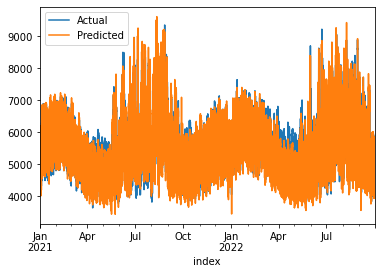

In [ ]:
predicted_vs_actual = predicted_vs_actual.set_index('index')
predicted_vs_actual.plot()

#### The following conclusions are:

electricity consumption has a clear seasonal pattern. There is a trend increase in consumption associated with an increase in the average daily temperature. Accurate predictive data were obtained in machine learning models by identifying factors such as temperature, humidex, hour of a day. I have built various regression models of machine learning. The best ones for this task are RandomForest and Catboost.

The goal and objectives of the project were achieved: electricity consumption was predicted based on the data. It is important to note that in order to increase the reliability of the forecast, it is necessary to get more data, to try feature engineering to artificially expand the data, to look closer at some of the meteo factors such as humidex and windchill, and also to try ensemble modeling for getting better results.
